<a href="https://colab.research.google.com/github/adityakangune/MSI_Alignemnt/blob/development_phase/All_in_one.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

In [ ]:
# npy_file_path = '/content/drive/Othercomputers/My laptop/Purdue University/RA/MS images/pixels_raw_18_1.npy'
npy_file_path = "/content/drive/Othercomputers/My Laptop/Purdue University/Semester 2/Lab Work/data-2/numpy_data/047-pixels.npy"
brain_image_data = np.load(npy_file_path)
brain_image_data.shape

(177, 584, 101)

In [ ]:
brain_image_data[:, :, 100].shape

(177, 584)

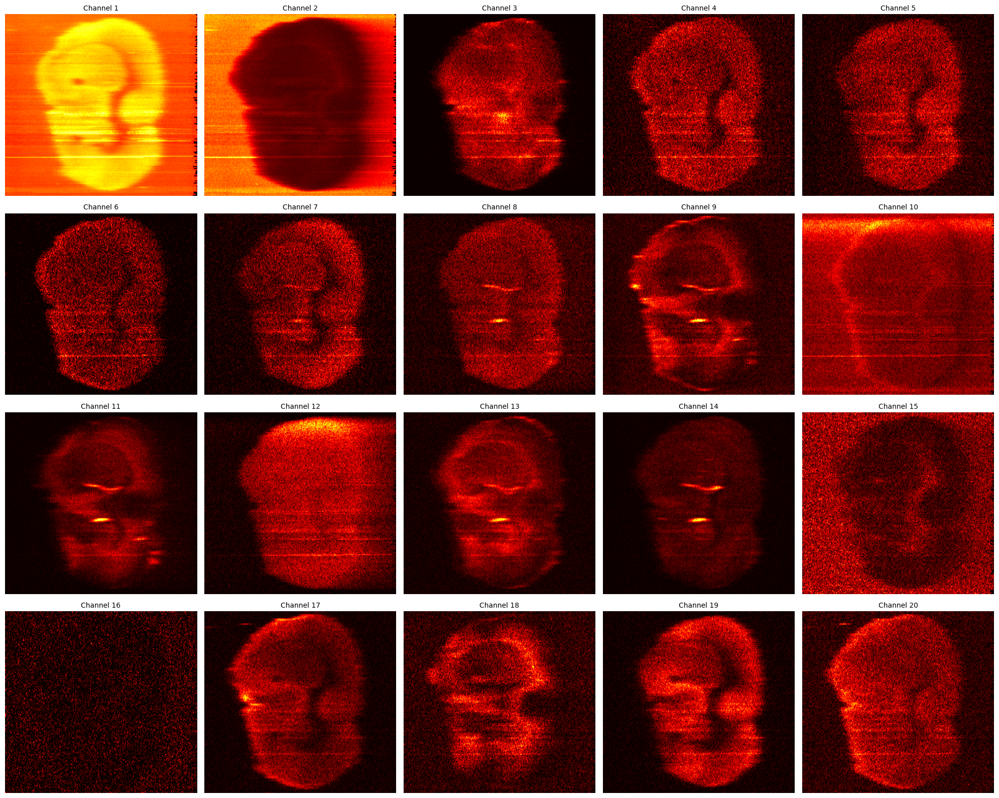

In [ ]:
# Sagittal Plane
brain_image_data = np.load(npy_file_path)
total_channels = 20
cols = 5
rows = (total_channels + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
for i in range(total_channels):
    row = i // cols
    col = i % cols
    ax = axes[row, col]
    ax.imshow(brain_image_data[:, :, i], cmap='hot', aspect='auto')
    ax.set_title(f'Channel {i+1}', fontsize=10)
    ax.axis('off')
for i in range(total_channels, rows*cols):
    axes[i // cols, i % cols].axis('off')
plt.tight_layout()
plt.show()

## Intensity plots

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Simulated MSI data for demonstration purposes
# # Assuming the data is in a numpy array named 'brain_image_data'
# # brain_image_data = np.random.rand(177, 584, 200)  # Random data for example

# # Summing intensities across the third dimension
# summed_intensity_image = np.sum(brain_image_data, axis=2)
# max_intensity_image = np.max(brain_image_data, axis=2)

# # Display summed and max intensity images
# plt.figure(figsize=(10, 5))

# plt.subplot(1, 2, 1)
# plt.imshow(summed_intensity_image, cmap='viridis')
# plt.title('Summed Intensity Image')
# plt.colorbar()

# plt.subplot(1, 2, 2)
# plt.imshow(max_intensity_image, cmap='viridis')
# plt.title('Max Intensity Image')
# plt.colorbar()

# plt.show()

In [ ]:

# # Normalization methods
# from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
# import matplotlib.pyplot as plt

# # Reshape data for normalization
# reshaped_data = summed_intensity_image.flatten().reshape(-1, 1)

# # Standard normalization
# standard_scaler = StandardScaler()
# standard_normalized = standard_scaler.fit_transform(reshaped_data).reshape(summed_intensity_image.shape)

# # Min-max normalization
# minmax_scaler = MinMaxScaler()
# minmax_normalized = minmax_scaler.fit_transform(reshaped_data).reshape(summed_intensity_image.shape)

# # Robust normalization
# robust_scaler = RobustScaler()
# robust_normalized = robust_scaler.fit_transform(reshaped_data).reshape(summed_intensity_image.shape)

# # Log normalization (adding a small constant to avoid log(0))
# log_normalized = np.log1p(summed_intensity_image)

# # Plotting the normalized images
# fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# axs[0, 0].imshow(standard_normalized, cmap='viridis')
# axs[0, 0].set_title('Standard Normalization')
# axs[0, 0].axis('off')

# axs[0, 1].imshow(minmax_normalized, cmap='viridis')
# axs[0, 1].set_title('Min-Max Normalization')
# axs[0, 1].axis('off')

# axs[1, 0].imshow(robust_normalized, cmap='viridis')
# axs[1, 0].set_title('Robust Normalization')
# axs[1, 0].axis('off')

# axs[1, 1].imshow(log_normalized, cmap='viridis')
# axs[1, 1].set_title('Log Normalization')
# axs[1, 1].axis('off')

# plt.tight_layout()
# plt.show()

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.filters import threshold_local

# # Assuming 'brain_image_data' is your MSI data array with shape (height, width, channels)
# brain_image_data_no_background = np.zeros_like(brain_image_data)

# # Parameters for adaptive thresholding
# block_size = 35  # Size of the local region around each pixel to calculate the threshold (choose based on your image resolution)
# offset = 10      # Constant subtracted from mean or weighted mean (tweak this based on the intensity distribution of your images)

# for i in range(brain_image_data.shape[2]):
#     # Calculate local thresholds for this channel
#     local_thresh = threshold_local(brain_image_data[:, :, i], block_size, offset=offset)
#     # Apply local thresholding
#     brain_image_data_no_background[:, :, i] = np.where(brain_image_data[:, :, i] > local_thresh, brain_image_data[:, :, i], 0)

# # Visualization of the effect of background removal on a single channel
# channel_index = 49  # Example channel index

# plt.figure(figsize=(15, 6))

# # Original channel
# plt.subplot(1, 2, 1)
# plt.imshow(brain_image_data[:, :, channel_index], cmap='hot', aspect='auto')
# plt.title(f'Original Channel {channel_index}')

# # Channel after background removal
# plt.subplot(1, 2, 2)
# plt.imshow(brain_image_data_no_background[:, :, channel_index], cmap='hot', aspect='auto')
# plt.title(f'Channel {channel_index} After Background Removal')
# plt.colorbar()

# plt.show()


# Optical Image

## Flip the images

In [ ]:
from PIL import Image

# Load the TIFF file
# image_path = "/content/drive/Othercomputers/My laptop/Purdue University/RA/optical images/18-1 aft exp.TIF"
# image_path = "/content/drive/Othercomputers/My laptop/Purdue University/RA/optical images/17-2 after exp.tif"
image_path = "/content/drive/Othercomputers/My Laptop/Purdue University/Semester 2/Lab Work/data-2/Optical Data/047.tif"
image = Image.open(image_path)

# Vertically flip the image
flipped_image = image.transpose(Image.FLIP_TOP_BOTTOM)

In [ ]:
# from skimage.color import rgba2rgb, rgb2gray
# from skimage.transform import resize
# import numpy as np

# # 4. Convert and Resize Optical Image
# optical_image_array = np.array(flipped_image)
# optical_image_rgb = rgba2rgb(optical_image_array) if optical_image_array.shape[-1] == 4 else optical_image_array
# image_gray = rgb2gray(optical_image_rgb)
# optical_image_resized = resize(image_gray, brain_image_data[:, :, 0].shape, anti_aliasing=True)

In [ ]:
# Open a TIFF image file
# image_path = "/content/drive/Othercomputers/My laptop/Purdue University/RA/optical images/flipped_17-1 after exp.tif"
# image_path = "/content/drive/Othercomputers/My laptop/Purdue University/RA/optical images/flipped_17-2_after_exp.tif"
# image_path = "/content/drive/Othercomputers/My laptop/Purdue University/RA/optical images/flipped_18_1_after_exp.tif"
# image_path = "/content/drive/Othercomputers/My Laptop/Purdue University/Semester 2/Lab Work/data-2/047.tif"
# tiff_image = Image.open(image_path)
tiff_image = flipped_image
# Converting to numpy
optical_image_array = np.array(tiff_image)
print(optical_image_array.shape)

# plt.imshow(optical_image_array)
# plt.title('Optical Image')
# plt.axis('off')

(2497, 2417, 4)


In [ ]:
!pip install brainreg brainreg-segment napari[all] scikit-image tifffile

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 31.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 40.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.6/80.6 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.7/123.7 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.3/92.3 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.7/300.7 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.4/727.4 kB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.6/90.6 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import numpy as np
import tifffile as tiff
from skimage.transform import rescale
import os

In [ ]:
import numpy as np
import tifffile as tiff
from skimage.transform import rescale
import os

# Load your optical image
optical_image = optical_image_array  # Example data, replace with actual optical data

import numpy as np
import tifffile as tiff
import os
from skimage.color import rgb2gray

# Load the RGBA image
optical_image_path = '/content/brainreg_input/optical_image.tiff'
optical_image_rgba = tiff.imread(optical_image_path)

# Convert RGBA to RGB
optical_image_rgb = optical_image_rgba[:, :, :3]

# Convert RGB to grayscale
optical_image_gray = rgb2gray(optical_image_rgb)

# Save the grayscale image as a TIFF file
grayscale_image_path = os.path.join('/content/brainreg_input', 'optical_image_gray.tiff')
tiff.imwrite(grayscale_image_path, optical_image_gray.astype(np.float32))




In [ ]:
output_directory = "/content/brainreg_output"
os.makedirs(output_directory, exist_ok=True)

voxel_sizes = "18 18 18"  # Assuming original resolution is 18 microns

# Run brainreg registration
optical_command = f"brainreg {grayscale_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v {voxel_sizes} --debug"

# Execute the command and capture output
optical_result = os.system(optical_command)
print(f"Optical Registration Command Result: {optical_result}")

# List the contents of the output directory
output_files = os.listdir(output_directory)
print("Output Directory Contents:", output_files)



Optical Registration Command Result: 256
Output Directory Contents: ['brainreg.json', 'brainreg_2024-06-11_16-37-16.log', 'brainreg_2024-06-11_16-38-30.log', '.ipynb_checkpoints', 'brainreg_2024-06-11_16-40-16.log', 'brainreg_2024-06-11_16-33-28.log', 'brainreg_2024-06-11_16-35-20.log', 'brainreg_2024-06-11_16-31-12.log']


In [ ]:
import tifffile as tiff

# Load and print the shape of the input TIFF file to ensure it is correctly formatted
try:
    optical_image = tiff.imread(optical_image_path)
    print(f"Optical image shape: {optical_image.shape}")
except Exception as e:
    print(f"Error loading TIFF file: {e}")


Optical image shape: (2497, 2417, 4)


In [ ]:
import numpy as np
import tifffile as tiff
from skimage.transform import rescale

# Create a smaller test image
smaller_optical_image = optical_image[:100, :100]  # Adjust as necessary for size

# Convert to TIFF format for brainreg compatibility
small_optical_image_path = os.path.join(input_directory, "small_optical_image.tiff")
tiff.imwrite(small_optical_image_path, smaller_optical_image.astype(np.float32))

# Run brainreg registration with the smaller image
small_optical_command = f"brainreg {small_optical_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v 18 18 18 --debug"
small_optical_result = os.system(small_optical_command)
print(f"Small Optical Registration Command Result: {small_optical_result}")

# List the contents of the output directory
print("Output Directory Contents:", os.listdir(output_directory))


Small Optical Registration Command Result: 256
Output Directory Contents: ['brainreg.json', '.ipynb_checkpoints', 'brainreg_2024-06-11_16-33-28.log', 'brainreg_2024-06-11_16-35-20.log', 'brainreg_2024-06-11_16-31-12.log']


In [ ]:
import napari
import matplotlib.pyplot as plt
from skimage import exposure

# Define path for the registered image
registered_image_path = os.path.join(output_directory, "downsampled_standard/moving_images/registered_image.tiff")

# Load and visualize the registered image
try:
    registered_image = tiff.imread(registered_image_path)
    registered_image_normalized = exposure.rescale_intensity(registered_image, in_range='image', out_range=(0, 1))

    plt.figure(figsize=(10, 5))
    plt.title(f"Registered Optical Image: {os.path.basename(registered_image_path)}")
    plt.imshow(registered_image_normalized, cmap='gray')
    plt.axis('off')
    plt.show()

    # Use Napari for interactive visualization
    viewer = napari.Viewer()
    viewer.add_image(registered_image_normalized, colormap='gray', name=f"Registered Optical Image: {os.path.basename(registered_image_path)}")
    napari.run()
except Exception as e:
    print(f"Error loading {registered_image_path}: {e}")


Error loading /content/brainreg_output/downsampled_standard/moving_images/registered_image.tiff: [Errno 2] No such file or directory: '/content/brainreg_output/downsampled_standard/moving_images/registered_image.tiff'


# !pip install SimpleITK


In [ ]:
!apt-get install elastix

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libfftw3-double3 libfftw3-single3 libinsighttoolkit5.2 libminc2-5.2.0
Suggested packages:
  elastix-doc libfftw3-bin libfftw3-dev
The following NEW packages will be installed:
  elastix libfftw3-double3 libfftw3-single3 libinsighttoolkit5.2 libminc2-5.2.0
0 upgraded, 5 newly installed, 0 to remove and 45 not upgraded.
Need to get 15.3 MB of archives.
After this operation, 72.4 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libfftw3-double3 amd64 3.3.8-2ubuntu8 [770 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libfftw3-single3 amd64 3.3.8-2ubuntu8 [800 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libminc2-5.2.0 amd64 2.4.03-5 [227 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libinsighttoolkit5.2 amd64 5.2.1-3 [5,874 kB]
Get:5 http://ar

In [ ]:
import numpy as np
import tifffile as tiff
import os
from skimage.color import rgb2gray

# Load the RGBA image
optical_image_path = '/content/brainreg_input/optical_image.tiff'
optical_image_rgba = tiff.imread(optical_image_path)

# Convert RGBA to RGB
optical_image_rgb = optical_image_rgba[:, :, :3]

# Convert RGB to grayscale
optical_image_gray = rgb2gray(optical_image_rgb)

# Save the grayscale image as a TIFF file
grayscale_image_path = os.path.join('/content/brainreg_input', 'optical_image_gray.tiff')
tiff.imwrite(grayscale_image_path, optical_image_gray.astype(np.float32))


In [ ]:
import requests
import SimpleITK as sitk

# Download the template image
atlas_template_url = "http://download.alleninstitute.org/informatics-archive/current-release/mouse_ccf/average_template/average_template_25.nrrd"
response = requests.get(atlas_template_url)
with open("/content/average_template_25.nrrd", 'wb') as f:
    f.write(response.content)

# Convert NRRD to NII format
atlas_template = sitk.ReadImage("/content/average_template_25.nrrd")
atlas_template_path = "/content/brainreg_input/average_template_25.nii"
sitk.WriteImage(atlas_template, atlas_template_path)


In [ ]:
import os

# Define output directory for registration results
output_directory = "/content/elastix_output"
os.makedirs(output_directory, exist_ok=True)

# Define elastix command
elastix_command = f"elastix -f {atlas_template_path} -m {grayscale_image_path} -out {output_directory} -p /usr/share/elastix/parameters_Rigid.txt"

# Execute the command
elastix_result = os.system(elastix_command)
print(f"Elastix Registration Command Result: {elastix_result}")

# List the contents of the output directory
output_files = os.listdir(output_directory)
print("Output Directory Contents:", output_files)


Elastix Registration Command Result: 256
Output Directory Contents: ['elastix.log']


In [ ]:
import requests

# Download example parameter file for rigid registration
parameter_file_url = "https://raw.githubusercontent.com/SuperElastix/elastix/master/src/Components/Transforms/Rigid/parameter_Rigid.txt"
parameter_file_path = "/content/parameter_Rigid.txt"
response = requests.get(parameter_file_url)
with open(parameter_file_path, 'wb') as f:
    f.write(response.content)

print(f"Downloaded parameter file to {parameter_file_path}")


Downloaded parameter file to /content/parameter_Rigid.txt


In [ ]:
import os

# Define elastix command with the downloaded parameter file
elastix_command = f"elastix -f {atlas_template_path} -m {grayscale_image_path} -out {output_directory} -p {parameter_file_path}"

# Execute the command and capture output
elastix_result = os.system(elastix_command)
print(f"Elastix Registration Command Result: {elastix_result}")

# List the contents of the output directory
output_files = os.listdir(output_directory)
print("Output Directory Contents:", output_files)


Elastix Registration Command Result: 256
Output Directory Contents: ['elastix.log']


## Resize the optical image

In [ ]:
# brain_image_data = brain_image_data_no_background

In [ ]:
brain_image_data[:, :, 0].shape

(177, 584)

In [ ]:
from skimage.color import rgba2rgb, rgb2gray
from skimage.transform import resize

# Convert the RGBA image to RGB and convert to grayscale and resize it
# Step 1: Convert to grayscale
# First, convert RGBA to RGB if necessary, then to grayscale to avoid the alpha channel issue
optical_image_rgb = rgba2rgb(optical_image_array) # For converting from 4 channel to 3
image_gray = rgb2gray(optical_image_rgb)

# Step 2: Resize to the desired dimensions
optical_image_resized = resize(image_gray, brain_image_data[:, :, 0].shape, anti_aliasing=True)

# Checking the shape of the resized image
print(optical_image_resized.shape)

# plt.imshow(optical_image_resized, aspect="auto", cmap="hot")
# plt.title('Resized Optical Image')
# plt.axis('off')


(177, 584)


In [ ]:
print(brain_image_data.shape)
print(optical_image_resized.shape)

(177, 584, 101)
(177, 584)


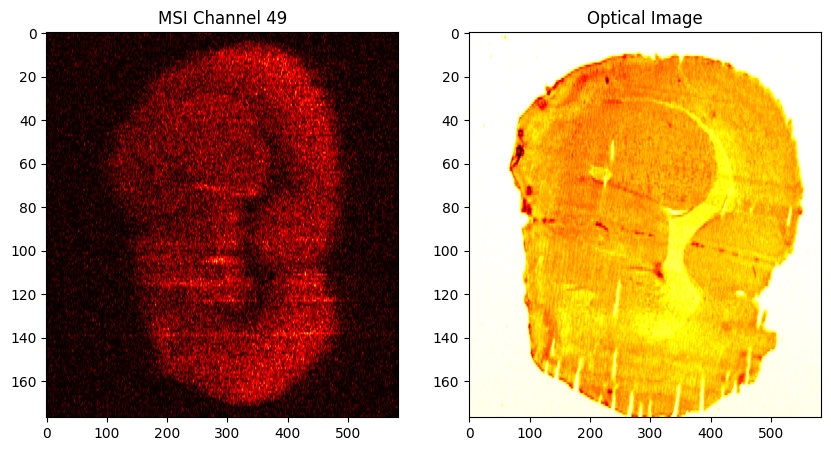

Shape of 49th MSI Channel: (177, 584)
Shape of Optical Image: (177, 584)


In [ ]:
# 5. Visualization and Comparison
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(brain_image_data[:, :, 6], cmap='hot', aspect="auto")
plt.title('MSI Channel 49')
plt.subplot(1, 2, 2)
plt.imshow(optical_image_resized, cmap='hot', aspect="auto")
plt.title('Optical Image')
plt.show()

print(f"Shape of 49th MSI Channel: {brain_image_data[:, :, 49].shape}")
print(f"Shape of Optical Image: {optical_image_resized.shape}")

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.transform import AffineTransform, warp
# from skimage.feature import canny
# from scipy.ndimage import center_of_mass
# from skimage.measure import regionprops
# from skimage.color import rgb2gray

# def find_brain_center(image):
#     # Assume image is already in grayscale
#     edges = canny(image, sigma=3)
#     return center_of_mass(edges)

# def adjust_optical_image(optical_image, msi_image_sample, scale_factor=1.05):
#     # Find centers
#     optical_center = find_brain_center(optical_image)
#     msi_center = find_brain_center(msi_image_sample)
#     print(optical_center)
#     print(msi_center)

#     # Calculate translation
#     translation = (msi_center[0] - optical_center[0], msi_center[1] - optical_center[1])

#     # Adjust the scale factor manually if the automatic scaling is not appropriate
#     # scale_factor = 1.05  # This can be adjusted based on visual feedback or empirical evidence

#     # Define affine transformation for translation and scaling
#     transform = AffineTransform(scale=(scale_factor, scale_factor), translation=translation)

#     # Apply transformation with padding to handle edges going out of frame
#     optical_transformed = warp(optical_image, transform.inverse, mode='constant', cval=optical_image.min(), preserve_range=True)

#     return optical_transformed

# # Assuming the images are already loaded and preprocessed correctly
# msi_image_sample = brain_image_data[:, :, 49]  # Using one MSI channel as reference
# optical_image_resized = rgb2gray(optical_image_resized) if optical_image_resized.ndim == 3 else optical_image_resized

# # Apply the adjusted transformation
# adjusted_optical = adjust_optical_image(optical_image_resized, msi_image_sample)

# # Visualization to check the results
# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.imshow(msi_image_sample, cmap='hot', aspect="auto")
# plt.title('MSI Sample Channel')
# plt.subplot(1, 2, 2)
# plt.imshow(adjusted_optical, cmap='hot', aspect="auto")
# plt.title('Adjusted Optical Image')
# plt.show()


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage import measure, color, filters
# from skimage.color import rgb2gray

# def find_brain_center(image):
#     # Convert to grayscale if the image is in color
#     if image.ndim == 3:
#         image = rgb2gray(image)

#     # Apply a threshold to isolate the brain (foreground)
#     threshold_value = filters.threshold_otsu(image)
#     brain_mask = image > threshold_value

#     # Label the image to find connected regions
#     labeled_brain = measure.label(brain_mask)
#     properties = measure.regionprops(labeled_brain)

#     # Assume the largest connected component is the brain
#     if properties:
#         largest_component = max(properties, key=lambda x: x.area)
#         return largest_component.centroid
#     else:
#         return (image.shape[0] / 2, image.shape[1] / 2)  # Default to image center if no regions found

# # Example usage:
# msi_sample = brain_image_data[:, :, 49]  # A sample channel from MSI data
# optical_sample = optical_image_resized  # The optical image

# msi_center = find_brain_center(msi_sample)
# optical_center = find_brain_center(optical_sample)

# print("MSI Center:", msi_center)
# print("Optical Center:", optical_center)

# # Visualization to confirm the centers
# fig, ax = plt.subplots(1, 2, figsize=(12, 6))
# ax[0].imshow(msi_sample, cmap='hot', aspect='auto')
# ax[0].scatter(msi_center[1], msi_center[0], color='blue', s=50)  # x and y are reversed in plt.scatter
# ax[0].set_title('MSI Channel with Center')
# ax[1].imshow(optical_sample, cmap='hot', aspect='auto')
# ax[1].scatter(optical_center[1], optical_center[0], color='blue', s=50)
# ax[1].set_title('Optical Image with Center')
# plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import measure, filters
from skimage.color import rgb2gray

def crop_brain_region_msi(image):
    # Ensure the image is in grayscale
    if image.ndim == 3:
        image = rgb2gray(image)

    # Apply a threshold to isolate the brain (foreground)
    threshold_value = filters.threshold_otsu(image)
    brain_mask = image > threshold_value

    # Find connected components and properties
    labeled_brain = measure.label(brain_mask)
    regions = measure.regionprops(labeled_brain)

    # Find the region with the largest area (assuming it's the brain)
    if regions:
        largest_region = max(regions, key=lambda x: x.area)
        minr, minc, maxr, maxc = largest_region.bbox
        cropped_image = image[minr:maxr, minc:maxc]  # Crop the brain region
        return cropped_image
    else:
        return image  # Return the original if no regions are found

def crop_brain_using_kmeans_optical(optical_image_array):
    # Check if the image is grayscale
    if optical_image_array.ndim == 3:
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(optical_image_array, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = optical_image_array  # If already grayscale, no need to convert

    # Reshape the grayscale image into a 2D array of pixels
    pixels = gray_image.reshape((-1, 1)).astype(np.float32)

    # Convert the pixels to the range [0,1] for K-means clustering
    pixels /= 255.0

    # Define the number of clusters (you may need to adjust this based on your image)
    num_clusters = 2

    # Perform K-means clustering
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, _ = cv2.kmeans(pixels, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Reshape the labels into the original image shape
    segmented_image = labels.reshape(gray_image.shape)

    # Assuming the brain slice has a different label (cluster) than the background
    # You may need to adjust this based on the clustering results
    brain_label = 1

    # Mask the brain slice from the segmented image
    brain_slice_mask = np.where(segmented_image == brain_label, 255, 0).astype(np.uint8)

    # Find contours of the brain slice
    contours, _ = cv2.findContours(brain_slice_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Assuming the largest contour corresponds to the brain slice
    largest_contour = max(contours, key=cv2.contourArea)

    # Get the bounding box of the largest contour
    x, y, w, h = cv2.boundingRect(largest_contour)

    # Crop the original image using the bounding box coordinates
    cropped_image = optical_image_array[y:y+h, x:x+w]

    return cropped_image

Cropped MSI shape:  (171, 401)
Cropped Optical shape:  (168, 488)


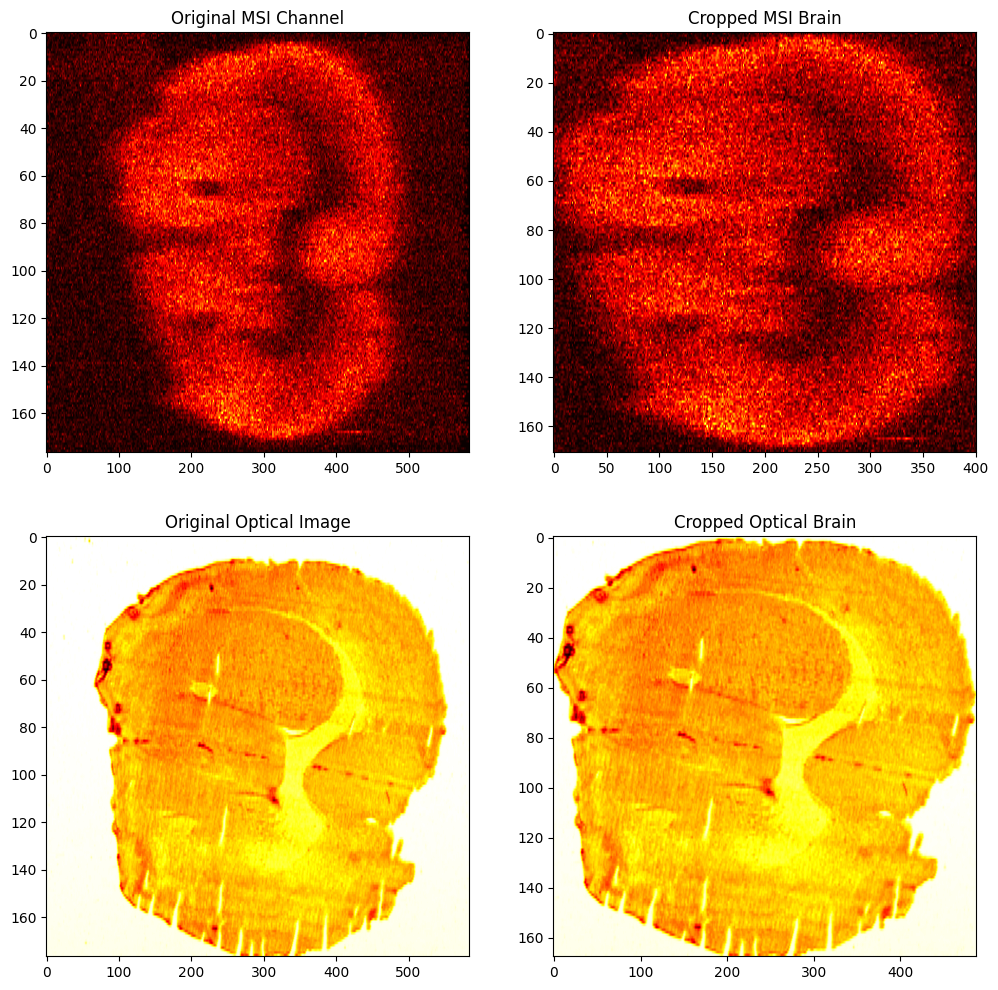

In [ ]:
# Example usage:
msi_sample = brain_image_data[:, :, 49]  # A sample channel from MSI data
optical_sample = optical_image_resized  # The optical image

cropped_msi_brain = crop_brain_region_msi(msi_sample)
cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

print("Cropped MSI shape: ", cropped_msi_brain.shape)
print("Cropped Optical shape: ", cropped_optical_brain.shape)

# Visualization to confirm the brain cropping
fig, ax = plt.subplots(2, 2, figsize=(12, 12))
ax[0, 0].imshow(msi_sample, cmap='hot', aspect='auto')
ax[0, 0].set_title('Original MSI Channel')
ax[0, 1].imshow(cropped_msi_brain, cmap='hot', aspect='auto')
ax[0, 1].set_title('Cropped MSI Brain')

ax[1, 0].imshow(optical_sample, cmap='hot', aspect='auto')
ax[1, 0].set_title('Original Optical Image')
ax[1, 1].imshow(cropped_optical_brain, cmap='hot', aspect='auto')
ax[1, 1].set_title('Cropped Optical Brain')
plt.show()

MSI shape:  (171, 488)
Optical shape:  (171, 488)


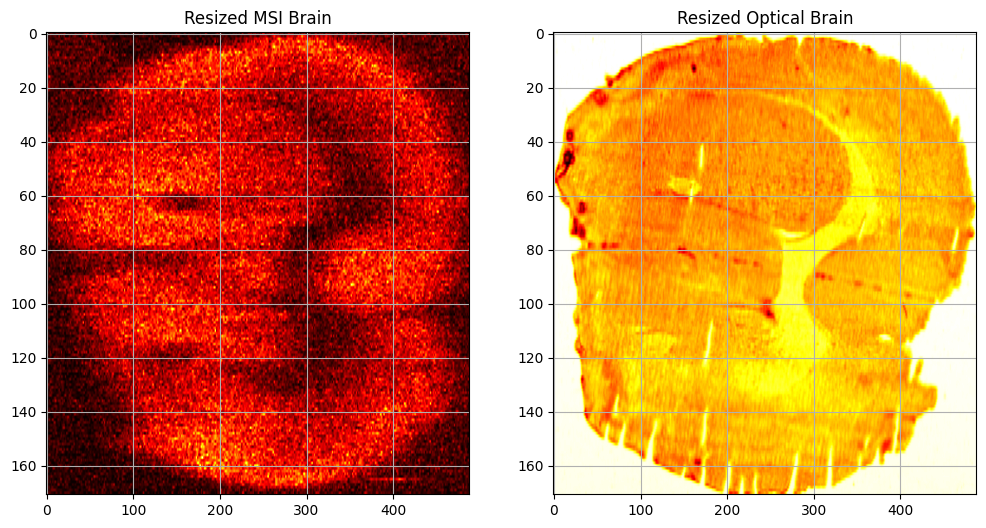

In [ ]:

from skimage.transform import resize

def auto_target_shape(msi_image, optical_image):
    # Determine the larger dimensions between the two images
    target_height = max(msi_image.shape[0], optical_image.shape[0])
    target_width = max(msi_image.shape[1], optical_image.shape[1])
    return (target_height, target_width)

def resize_images(msi_image, optical_image):
    target_shape = auto_target_shape(msi_image, optical_image)
    # Resize both images to the same target shape
    resized_msi = resize(msi_image, target_shape, preserve_range=True, anti_aliasing=True)
    resized_optical = resize(optical_image, target_shape, preserve_range=True, anti_aliasing=True)
    return resized_msi, resized_optical


# Cell for resizing images
resized_msi, resized_optical = resize_images(cropped_msi_brain, cropped_optical_brain)
print("MSI shape: ", resized_msi.shape)
print("Optical shape: ", resized_optical.shape)


# Displaying images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(resized_msi, cmap='hot', aspect='auto')
plt.title("Resized MSI Brain")
plt.grid(True)  # Add grid lines
# plt.axis('off')  # Hide axis

plt.subplot(1, 2, 2)
plt.imshow(resized_optical, cmap='hot', aspect='auto')
plt.title('Resized Optical Brain')
plt.grid(True)  # Add grid lines
# plt.axis('off')  # Hide axis

plt.show()


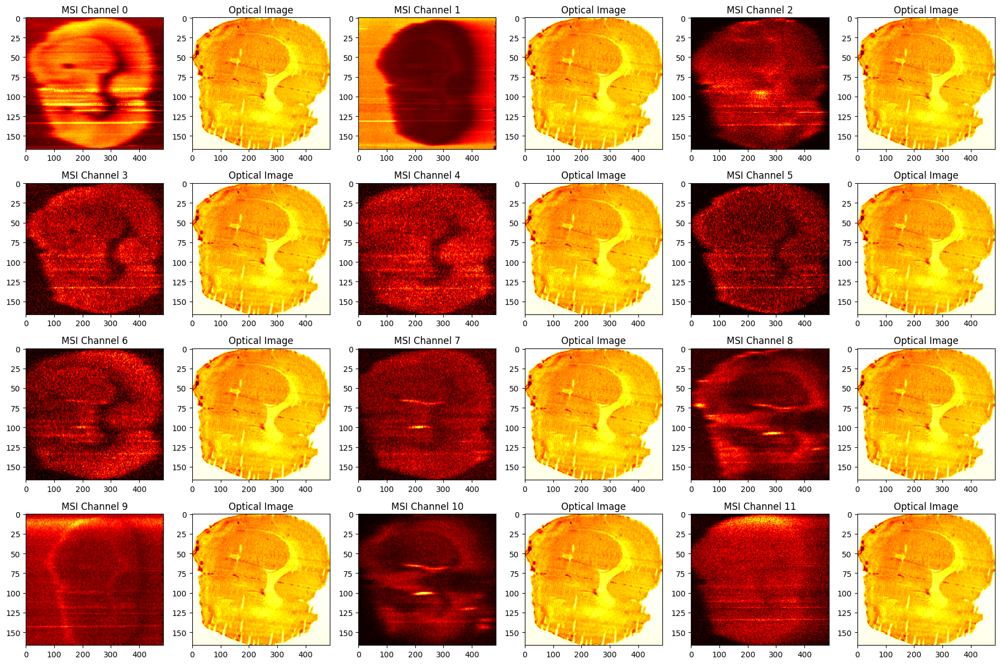

In [ ]:
import matplotlib.pyplot as plt
import cv2  # Make sure OpenCV is imported

# Example preparation of cropped_brain_region_msi function or similar must be done before this

# Assuming 'crop_brain_region_msi' and 'crop_brain_using_kmeans_optical' are defined and functional
msi_sample = brain_image_data[:, :, 0]  # Using the first channel of MSI
optical_sample = optical_image_resized  # The optical image, already resized

cropped_msi_brain = crop_brain_region_msi(msi_sample)
cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

# Determine the size to resize MSI images to match the optical image
x_offset, y_offset = cropped_optical_brain.shape[1], cropped_optical_brain.shape[0]

# Determine the number of rows needed for displaying 10 channels (3 MSI and 1 optical per row)
num_channels = 12
channels_per_row = 3
num_rows = (num_channels + channels_per_row - 1) // channels_per_row  # Round up to ensure all channels fit

# For displaying the first 10 MSI channels in a grid of num_rows x 6 columns
fig, axs = plt.subplots(num_rows, 6, figsize=(18, 3 * num_rows))  # Adjust figure size as needed

for i in range(num_channels):
    msi_sample = brain_image_data[:, :, i]
    cropped_msi_brain = crop_brain_region_msi(msi_sample)
    cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

    # Calculate row and column index for plotting
    row = i // channels_per_row
    col = (i % channels_per_row) * 2  # Each MSI channel takes two columns

    axs[row, col].imshow(cropped_msi_resized, cmap='hot', aspect='auto')
    axs[row, col].set_title(f'MSI Channel {i}')
    # axs[row, col].axis('off')  # Hide axes

    axs[row, col + 1].imshow(cropped_optical_brain, cmap='hot', aspect='auto')
    axs[row, col + 1].set_title('Optical Image')
    # axs[row, col + 1].axis('off')  # Hide axes

plt.tight_layout()
plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import cv2
# from skimage.metrics import structural_similarity as ssim

# # Function to calculate SSIM between two images
# def calculate_ssim(image1, image2):
#     # Ensure the images are of the same size
#     image1 = cv2.resize(image1, (image2.shape[1], image2.shape[0]))
#     # Calculate SSIM
#     return ssim(image1, image2, data_range=image2.max() - image2.min())

# # Cropped and resized versions of the optical image
# cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

# # Calculate SSIM for each MSI channel and store the scores
# ssim_scores = []
# for i in range(brain_image_data.shape[2]):
#     msi_sample = brain_image_data[:, :, i]
#     cropped_msi_brain = crop_brain_region_msi(msi_sample)
#     score = calculate_ssim(cropped_msi_brain, cropped_optical_brain)
#     ssim_scores.append((i, score))

# # Sort the channels based on SSIM scores in descending order and select the top 10
# top_10_matches = sorted(ssim_scores, key=lambda x: x[1], reverse=True)[:10]

# # For displaying the top 10 MSI channels in a 5x4 grid
# fig, axs = plt.subplots(5, 4, figsize=(12, 20))  # 5 rows, 4 columns for top 10 matches

# for idx, (i, score) in enumerate(top_10_matches):
#     msi_sample = brain_image_data[:, :, i]
#     cropped_msi_brain = crop_brain_region_msi(msi_sample)
#     cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

#     # Determine row and column index for plotting
#     row = idx // 2
#     col = (idx % 2) * 2  # Each MSI channel takes two columns

#     axs[row, col].imshow(cropped_msi_resized, cmap='hot', aspect='auto')
#     axs[row, col].set_title(f'MSI Channel {i} (SSIM: {score:.2f})')
#     axs[row, col].axis('off')  # Hide axes

#     axs[row, col + 1].imshow(cropped_optical_brain, cmap='hot', aspect='auto')
#     axs[row, col + 1].set_title('Optical Image')
#     axs[row, col + 1].axis('off')  # Hide axes

# plt.tight_layout()
# plt.show()


In [ ]:
# from skimage.metrics import structural_similarity as ssim

# # Calculate SSIM between two images
# def calculate_ssim(image1, image2):
#     return ssim(image1, image2)

# # Compare each channel of brain_image_data with optical image
# top_matches = []

# optical_sample = optical_image_resized  # The optical image

# # Use the first MSI channel to calculate the cropping coordinates for the optical image
# msi_sample = brain_image_data[:, :, 0]  # Choose the first channel
# cropped_msi_brain = crop_brain_region_msi(msi_sample)
# cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

# # Remember the cropping coordinates for the optical image
# x_offset, y_offset = cropped_optical_brain.shape[1], cropped_optical_brain.shape[0]

# for i in range(brain_image_data.shape[2]):
#     msi_sample = brain_image_data[:, :, i]  # A sample channel from MSI data

#     # Crop the MSI channel using the same coordinates as the optical image
#     cropped_msi_brain = crop_brain_region(msi_sample)

#     # Resize the cropped MSI image to match the size of the optical image
#     cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

#     # Calculate SSIM between the resized MSI and optical images
#     similarity_score = calculate_ssim(cropped_msi_resized, cropped_optical_brain)

#     # Store the similarity score along with the channel index
#     top_matches.append((i, similarity_score))

# # Sort the similarity scores in descending order
# top_matches.sort(key=lambda x: x[1], reverse=True)

# # Select the top 10 matches
# top_10_matches = top_matches[:10]
# print(top_10_matches)

# # Plot the top 10 matches
# fig, axs = plt.subplots(5, 4, figsize=(12, 15))

# for i, match in enumerate(top_10_matches):
#     msi_channel = brain_image_data[:, :, match[0]]

#     # Crop the MSI channel using the same coordinates as the optical image
#     cropped_msi_brain = crop_brain_region_msi(msi_channel)

#     # Resize the cropped MSI image to match the size of the optical image
#     cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

#     axs[i // 2, i % 2 * 2].imshow(cropped_msi_resized, cmap='hot', aspect='auto')
#     axs[i // 2, i % 2 * 2].set_title(f'MSI Channel {match[0]}')
#     axs[i // 2, i % 2 * 2 + 1].imshow(cropped_optical_brain, cmap='hot', aspect='auto')
#     axs[i // 2, i % 2 * 2 + 1].set_title('Optical Image')

# plt.tight_layout()
# plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import cv2
# from skimage.metrics import structural_similarity as ssim

# # Function to calculate SSIM between two images
# def calculate_ssim(image1, image2):
#     # Ensure images are the same size and normalize if necessary
#     return ssim(image1, image2)

# # Prepare the images
# msi_sample = brain_image_data[:, :, 0]  # First MSI channel
# optical_sample = optical_image_resized  # Optical image

# # Assume crop_brain_region_msi and crop_brain_using_kmeans_optical are properly defined
# cropped_msi_brain = crop_brain_region_msi(msi_sample)
# cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

# # Determine the size to resize MSI images to match the optical image
# x_offset, y_offset = cropped_optical_brain.shape[1], cropped_optical_brain.shape[0]

# # Initialize a list to store matches and their scores
# top_matches = []

# # Loop over all channels in the MSI data
# for i in range(brain_image_data.shape[2]):
#     msi_sample = brain_image_data[:, :, i]
#     cropped_msi_brain = crop_brain_region_msi(msi_sample)
#     cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

#     # Calculate SSIM
#     similarity_score = calculate_ssim(cropped_msi_resized, cropped_optical_brain)
#     top_matches.append((i, similarity_score))

# # Define a threshold for SSIM to consider a match as significant
# ssim_threshold = 0.1

# # Filter matches to find those above the threshold
# filtered_matches = [match for match in top_matches if match[1] > ssim_threshold]

# # Sort matches by SSIM score in descending order and select the top 10
# filtered_matches.sort(key=lambda x: x[1], reverse=True)
# top_10_matches = filtered_matches[:10]

# # Check if there are enough matches to display
# if top_10_matches:
#     # Plot the top 10 matches
#     fig, axs = plt.subplots(len(top_10_matches), 2, figsize=(12, 3 * len(top_10_matches)))

#     for i, (channel_index, score) in enumerate(top_10_matches):
#         msi_channel = brain_image_data[:, :, channel_index]
#         cropped_msi_brain = crop_brain_region_msi(msi_channel)
#         cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

#         axs[i, 0].imshow(cropped_msi_resized, cmap='hot', aspect='auto')
#         axs[i, 0].set_title(f'MSI Channel {channel_index} (SSIM: {score:.2f})')
#         axs[i, 0].axis('off')  # Hide axes

#         axs[i, 1].imshow(cropped_optical_brain, cmap='hot', aspect='auto')
#         axs[i, 1].set_title('Optical Image')
#         axs[i, 1].axis('off')  # Hide axes

#     plt.tight_layout()
#     plt.show()
# else:
#     print("No matches exceed the SSIM threshold.")


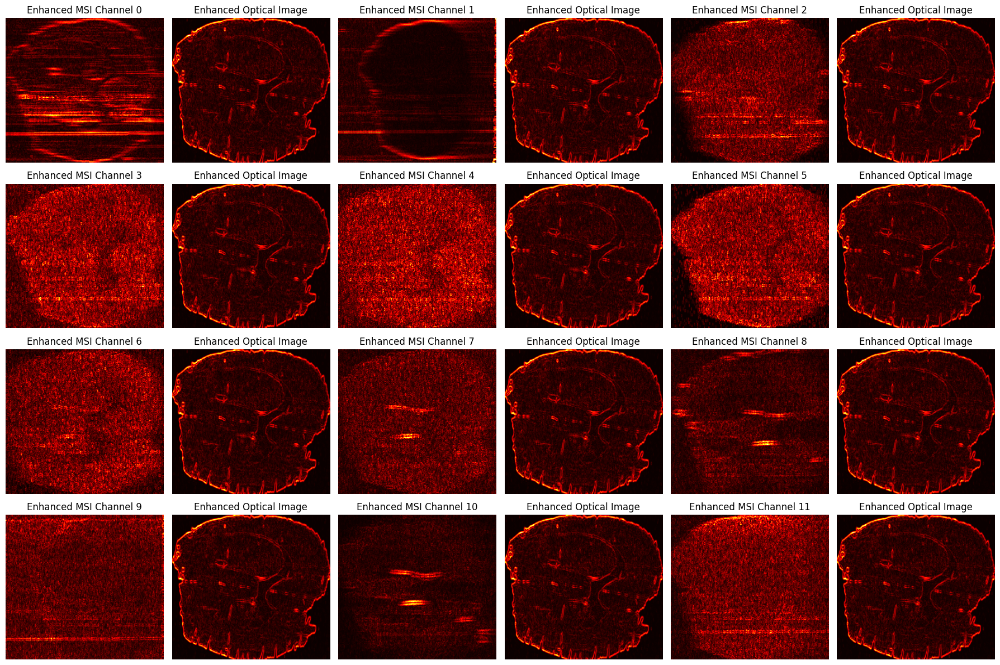

In [ ]:
import matplotlib.pyplot as plt
import cv2  # Ensure OpenCV is imported
from skimage import filters

# Function to enhance features using edge detection
def enhance_features(image):
    # Convert to grayscale if it's a color image
    if image.ndim == 3:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply edge detection
    edges = filters.sobel(image)
    return edges

# Assuming crop_brain_region_msi and crop_brain_using_kmeans_optical are defined and functional
msi_sample = brain_image_data[:, :, 0]  # First MSI channel
optical_sample = optical_image_resized  # Optical image

cropped_msi_brain = crop_brain_region_msi(msi_sample)
cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

# Determine the size to resize MSI images to match the optical image
x_offset, y_offset = cropped_optical_brain.shape[1], cropped_optical_brain.shape[0]

num_channels = 12  # Number of MSI channels to display
channels_per_row = 3
num_rows = (num_channels + channels_per_row - 1) // channels_per_row

fig, axs = plt.subplots(num_rows, 6, figsize=(18, 3 * num_rows))  # Each channel gets two columns in the grid

for i in range(num_channels):
    msi_sample = brain_image_data[:, :, i]
    cropped_msi_brain = crop_brain_region_msi(msi_sample)
    cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

    # Enhance features for better comparison
    enhanced_msi = enhance_features(cropped_msi_resized)
    enhanced_optical = enhance_features(cropped_optical_brain)

    row = i // channels_per_row
    col = (i % channels_per_row) * 2  # Two columns per MSI channel

    axs[row, col].imshow(enhanced_msi, cmap='hot', aspect='auto')
    axs[row, col].set_title(f'Enhanced MSI Channel {i}')
    axs[row, col].axis('off')  # Hide axes

    axs[row, col + 1].imshow(enhanced_optical, cmap='hot', aspect='auto')
    axs[row, col + 1].set_title('Enhanced Optical Image')
    axs[row, col + 1].axis('off')  # Hide axes

plt.tight_layout()
plt.show()


## Included histogram equalization, median filtering, and Gaussian blurring in addition to edge detection

In [ ]:
print(msi_sample.shape)
print(optical_sample.shape)


# # Assuming crop_brain_region_msi and crop_brain_using_kmeans_optical are defined and functional
# msi_sample = brain_image_data[:, :, 0]  # First MSI channel
# optical_sample = optical_image_resized  # Optical image

# cropped_msi_brain = crop_brain_region_msi(msi_sample)
# cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

(177, 584)
(177, 584)


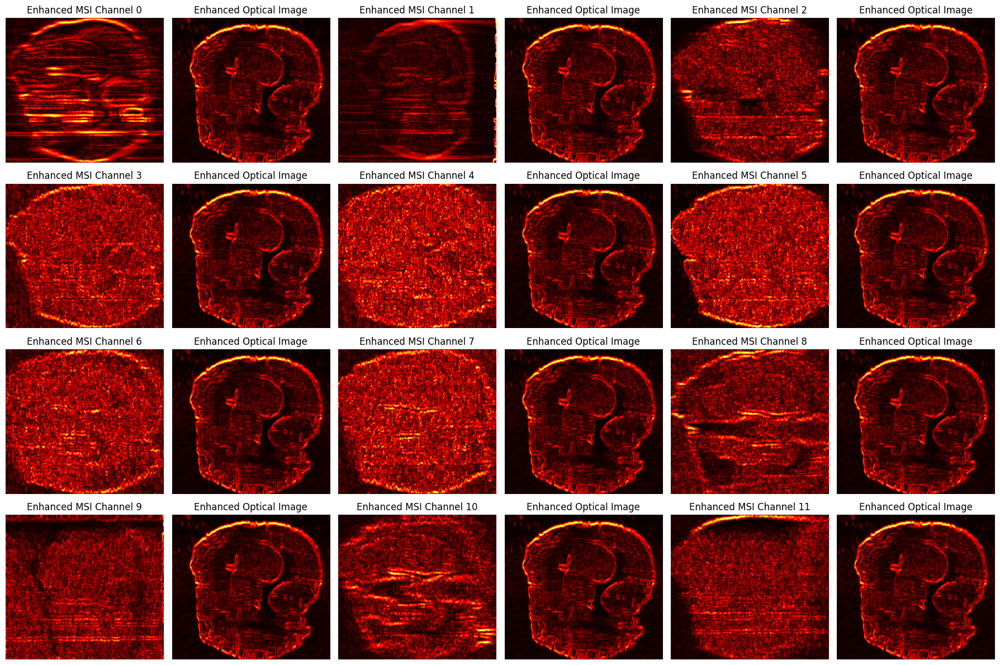

In [ ]:
import matplotlib.pyplot as plt
import cv2  # Ensure OpenCV is imported
from skimage import filters
from skimage import exposure
from skimage.filters import gaussian, median

# Function to enhance features using various image processing techniques
def enhance_features(image):
    # Convert to grayscale if it's a color image
    if image.ndim == 3:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply histogram equalization for better contrast
    image = exposure.equalize_hist(image)

    # Apply median filter to remove noise
    image = median(image)

    # Apply Gaussian blur for further smoothing
    image = gaussian(image, sigma=1)

    # Apply edge detection
    edges = filters.sobel(image)

    return edges

# Assuming crop_brain_region_msi and crop_brain_using_kmeans_optical are defined and functional
msi_sample = brain_image_data[:, :, 0]  # First MSI channel
optical_sample = optical_image_resized  # Optical image

cropped_msi_brain = crop_brain_region_msi(msi_sample)
cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

# Determine the size to resize MSI images to match the optical image
x_offset, y_offset = cropped_optical_brain.shape[1], cropped_optical_brain.shape[0]

num_channels = 12  # Number of MSI channels to display
channels_per_row = 3
num_rows = (num_channels + channels_per_row - 1) // channels_per_row

fig, axs = plt.subplots(num_rows, 6, figsize=(18, 3 * num_rows))  # Each channel gets two columns in the grid

for i in range(num_channels):
    msi_sample = brain_image_data[:, :, i]
    cropped_msi_brain = crop_brain_region_msi(msi_sample)
    cropped_msi_resized = cv2.resize(cropped_msi_brain, (x_offset, y_offset))

    # Enhance features for better comparison
    enhanced_msi = enhance_features(cropped_msi_resized)
    enhanced_optical = enhance_features(cropped_optical_brain)

    row = i // channels_per_row
    col = (i % channels_per_row) * 2  # Two columns per MSI channel

    axs[row, col].imshow(enhanced_msi, cmap='hot', aspect='auto')
    axs[row, col].set_title(f'Enhanced MSI Channel {i}')
    axs[row, col].axis('off')  # Hide axes

    axs[row, col + 1].imshow(enhanced_optical, cmap='hot', aspect='auto')
    axs[row, col + 1].set_title('Enhanced Optical Image')
    axs[row, col + 1].axis('off')  # Hide axes

plt.tight_layout()
plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import cv2  # Ensure OpenCV is imported
# from skimage import filters
# from skimage import exposure
# from skimage.filters import gaussian, median
# import ipywidgets as widgets
# from IPython.display import display

# # Function to enhance features using various image processing techniques
# def enhance_features(image):
#     # Convert to grayscale if it's a color image
#     if image.ndim == 3:
#         image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

#     # Apply histogram equalization for better contrast
#     image = exposure.equalize_hist(image)

#     # Apply median filter to remove noise
#     image = median(image)

#     # Apply Gaussian blur for further smoothing
#     image = gaussian(image, sigma=1)

#     # Apply edge detection
#     edges = filters.sobel(image)

#     return edges

# # Assuming crop_brain_region_msi and crop_brain_using_kmeans_optical are defined and functional
# msi_sample = brain_image_data[:, :, 0]  # First MSI channel
# optical_sample = optical_image_resized  # Optical image

# cropped_msi_brain = crop_brain_region_msi(msi_sample)
# cropped_optical_brain = crop_brain_using_kmeans_optical(optical_sample)

# enhanced_msi = enhance_features(cropped_msi_resized)
# enhanced_optical = enhance_features(cropped_optical_brain)

# # Sample MSI and optical images (replace these with your actual images)
# msi_sample = enhanced_msi  # Your MSI sample here
# optical_sample = enhanced_optical  # Your optical sample here

# # Sample coordinates for different regions of interest (replace these with your actual coordinates)
# hippocampus_coords = [(100, 100), (200, 200)]  # Example coordinates for the hippocampus
# prefrontal_cortex_coords = [(150, 150), (250, 250)]  # Example coordinates for the prefrontal cortex

# # Function to display images with a bounding rectangle based on the selected option
# def display_images_with_rect(option):
#     plt.figure(figsize=(16, 12))

#     # Enhance features for MSI and optical images
#     enhanced_msi = enhance_features(msi_sample)
#     enhanced_optical = enhance_features(optical_sample)

#     # Display the enhanced MSI image with bounding rectangle and zoomed-in region
#     plt.subplot(4, 4, 1)
#     plt.imshow(enhanced_msi, cmap='hot', aspect='auto')
#     plt.title('Enhanced MSI')
#     plt.axis('off')  # Hide axes
#     if option != 'Custom':
#         # Choose the coordinates based on the selected option
#         if option == 'Hippocampus':
#             coords = hippocampus_coords
#         elif option == 'Prefrontal Cortex':
#             coords = prefrontal_cortex_coords

#         # Draw bounding rectangle on the MSI image
#         for (x1, y1), (x2, y2) in [coords]:
#             plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='b', linewidth=2, fill=False))

#         # Zoomed-in region for MSI
#         zoomed_in_msi = enhanced_msi[coords[0][1]:coords[1][1], coords[0][0]:coords[1][0]]
#         plt.subplot(4, 4, 2)
#         plt.imshow(zoomed_in_msi, cmap='hot', aspect='auto')
#         plt.title('Zoomed MSI')
#         # plt.axis('off')  # Hide axes

#     # Display the enhanced optical image with bounding rectangle and zoomed-in region
#     plt.subplot(4, 4, 3)
#     plt.imshow(enhanced_optical, cmap='hot', aspect='auto')
#     plt.title('Enhanced Optical')
#     plt.axis('off')  # Hide axes
#     if option != 'Custom':
#         # Draw bounding rectangle on the optical image
#         for (x1, y1), (x2, y2) in [coords]:
#             plt.gca().add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='b', linewidth=2, fill=False))

#         # Zoomed-in region for optical
#         zoomed_in_optical = enhanced_optical[coords[0][1]:coords[1][1], coords[0][0]:coords[1][0]]
#         plt.subplot(4, 4, 4)
#         plt.imshow(zoomed_in_optical, cmap='hot', aspect='auto')
#         plt.title('Zoomed Optical')
#         # plt.axis('off')  # Hide axes

#     plt.show()

# # Define the dropdown widget with options
# options = ['Hippocampus', 'Prefrontal Cortex', 'Custom']

# # Create the dropdown widget
# dropdown = widgets.Dropdown(options=options, description='Select ROI:', layout={'width': 'max-content'})

# # Define the event handler for dropdown value change
# def on_change(change):
#     if change['type'] == 'change' and change['name'] == 'value':
#         display_images_with_rect(change['new'])

# # Attach the event handler to the dropdown widget
# dropdown.observe(on_change)

# # Display the dropdown widget
# display(dropdown)



# Alignment with Allen Brain Atlas

## Step 1: Download and Prepare Allen Brain Atlas Data

In [ ]:
# !pip install allensdk pynrrd brainreg brainreg-segment napari[all] scikit-image opencv-python

In [ ]:
# !pip show brainreg
# !brainreg --version

In [ ]:
print(msi_sample.shape)
print(optical_sample.shape)

(177, 584)
(177, 584)


In [ ]:
import numpy as np
import tifffile as tiff
from skimage.transform import rescale
import os

# Define your MSI and optical data
# msi_sample = np.random.rand(177, 584)  # Example data, replace with actual MSI data
# optical_sample = np.random.rand(177, 584)  # Example data, replace with actual optical data

# Downsample the images to reduce their resolution
downscale_factor = 2.0  # Adjust this factor as needed
msi_sample_downsampled = rescale(msi_sample, downscale_factor, anti_aliasing=True, channel_axis=None)
optical_sample_downsampled = rescale(optical_sample, downscale_factor, anti_aliasing=True, channel_axis=None)

# Convert numpy arrays to TIFF format for brainreg compatibility
def numpy_to_tiff(image, path):
    tiff.imwrite(path, image.astype(np.float32))  # Ensure the data type is appropriate for brainreg

# Define paths for temporary storage of in-memory TIFFs
input_directory = "/content/brainreg_input"
output_directory = "/content/brainreg_output"
msi_image_path = os.path.join(input_directory, "msi_image.tiff")
optical_image_path = os.path.join(input_directory, "optical_image.tiff")

# Ensure directories exist
os.makedirs(input_directory, exist_ok=True)
os.makedirs(output_directory, exist_ok=True)

# Save the in-memory TIFFs temporarily
numpy_to_tiff(msi_sample_downsampled, msi_image_path)
numpy_to_tiff(optical_sample_downsampled, optical_image_path)


In [ ]:
import os

# Define voxel sizes for your downsampled images
original_voxel_size = 18  # microns (original resolution)
downscale_factor = 2.0  # same as used in downsampling
downsampled_voxel_size = original_voxel_size / downscale_factor
voxel_sizes = f"{downsampled_voxel_size} {downsampled_voxel_size} {downsampled_voxel_size}"

# Run brainreg registration
msi_command = f"brainreg {msi_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v {voxel_sizes}"
optical_command = f"brainreg {optical_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v {voxel_sizes}"

# Execute the commands and capture output
msi_result = os.system(msi_command)
optical_result = os.system(optical_command)

print(f"MSI Registration Command Result: {msi_result}")
print(f"Optical Registration Command Result: {optical_result}")

# List the contents of the output directory
print("Output Directory Contents:", os.listdir(output_directory))

# List the contents of the subdirectory where registered images are expected
sub_dir = os.path.join(output_directory, "downsampled_standard/moving_images")
if os.path.exists(sub_dir):
    print("Subdirectory Contents:", os.listdir(sub_dir))
else:
    print(f"Subdirectory {sub_dir} does not exist.")


MSI Registration Command Result: 32512
Optical Registration Command Result: 32512
Output Directory Contents: []
Subdirectory /content/brainreg_output/downsampled_standard/moving_images does not exist.


In [ ]:
import os

# Check available CPU cores
cpu_count = os.cpu_count()
print(f"Available CPU cores: {cpu_count}")


Available CPU cores: 2


In [ ]:
import tifffile as tiff

# Validate MSI and optical TIFF files
try:
    msi_image = tiff.imread(msi_image_path)
    print(f"MSI image shape: {msi_image.shape}")

    optical_image = tiff.imread(optical_image_path)
    print(f"Optical image shape: {optical_image.shape}")

except Exception as e:
    print(f"Error reading TIFF files: {e}")


MSI image shape: (354, 1168)
Optical image shape: (354, 1168)


In [ ]:
import os

# Define voxel sizes for your images
original_voxel_size = 18  # microns (original resolution)
downscale_factor = 0.5  # same as used in downsampling
downsampled_voxel_size = original_voxel_size / downscale_factor
voxel_sizes = f"{downsampled_voxel_size} {downsampled_voxel_size} {downsampled_voxel_size}"

# Ensure sufficient CPU resources (check available CPU cores)
cpu_count = os.cpu_count()
print(f"Available CPU cores: {cpu_count}")

# Run brainreg registration with debugging enabled
msi_command = f"brainreg {msi_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v {voxel_sizes} --debug"
optical_command = f"brainreg {optical_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v {voxel_sizes} --debug"

# Execute the commands and capture output
msi_result = os.system(msi_command)
optical_result = os.system(optical_command)

print(f"MSI Registration Command Result: {msi_result}")
print(f"Optical Registration Command Result: {optical_result}")

# List the contents of the output directory
print("Output Directory Contents:", os.listdir(output_directory))

# List the contents of the subdirectory where registered images are expected
sub_dir = os.path.join(output_directory, "downsampled_standard/moving_images")
if os.path.exists(sub_dir):
    print("Subdirectory Contents:", os.listdir(sub_dir))
else:
    print(f"Subdirectory {sub_dir} does not exist.")


Available CPU cores: 2
MSI Registration Command Result: 32512
Optical Registration Command Result: 32512
Output Directory Contents: []
Subdirectory /content/brainreg_output/downsampled_standard/moving_images does not exist.


In [ ]:
import os

# List the contents of the output directory
output_files = os.listdir(output_directory)
print("Output Directory Contents:", output_files)


Output Directory Contents: []


In [ ]:
import os

# List the log files generated by brainreg
log_files = [file for file in os.listdir(output_directory) if file.endswith('.log')]
print("Log Files:", log_files)

# Read and print the contents of each log file
for log_file in log_files:
    with open(os.path.join(output_directory, log_file), 'r') as f:
        print(f"Contents of {log_file}:\n")
        print(f.read())


In [ ]:
import os

# Check available CPU cores
cpu_count = os.cpu_count()
print(f"Available CPU cores: {cpu_count}")

# Define voxel sizes for your images
original_voxel_size = 18  # microns (original resolution)
downscale_factor = 0.5  # same as used in downsampling
downsampled_voxel_size = original_voxel_size / downscale_factor
voxel_sizes = f"{downsampled_voxel_size} {downsampled_voxel_size} {downsampled_voxel_size}"

# Run brainreg registration with debugging enabled
msi_command = f"brainreg {msi_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v {voxel_sizes} --debug"
optical_command = f"brainreg {optical_image_path} {output_directory} --atlas allen_mouse_25um --orientation coronal -v {voxel_sizes} --debug"

# Execute the commands and capture output
msi_result = os.system(msi_command)
optical_result = os.system(optical_command)

print(f"MSI Registration Command Result: {msi_result}")
print(f"Optical Registration Command Result: {optical_result}")

# List the contents of the output directory
print("Output Directory Contents:", os.listdir(output_directory))


In [ ]:
https://purdue0.sharepoint.com/sites/COS-ChopraLab/_layouts/15/Doc2.aspx?action=edit&sourcedoc=%7Bbe99b36e-37bc-4d01-8870-86dd7a976684%7D&wdOrigin=TEAMS-MAGLEV.teamsSdk_ns.rwc&wdExp=TEAMS-TREATMENT&wdhostclicktime=1715261477017&web=1

## STOP

## Preprocess
### Rescale Intensity Ranges: Ensure that the intensity ranges of both the MSI data and the optical image are compatible. This might involve normalizing or scaling the intensities.

### Noise Reduction: Apply filtering to reduce noise in both datasets, which can improve the accuracy of alignment algorithms.

In [ ]:
print("MSI Image Shape: ", msi_image_array.shape)
print("Optical Image Shape: ", optical_image_array.shape)

The loaded NumPy array has a shape of
194
×
922
×
106
194×922×106, where the first two dimensions likely represent the spatial dimensions (pixels) of the brain image, and the third dimension represents different mass spectrometry intensities at each pixel.

To create the brain image, we can sum the intensities across the third dimension (106 mass spectra) for each pixel. This will result in a 2D image where each pixel's intensity is the sum of all mass spectrometry intensities at that point.

We can either take average of all the intensities or sum all the intensity values for a pixel over all the mass spectra (3rd dimension)

In [ ]:
# np.save(arr=msi_image_array, file=)
np.save('msi_image_array.npy', msi_image_array)
np.save('optical_image_array.npy', optical_image_array)

# Adding Alpha channel to the MSI image and resizing

In [ ]:
msi_image_shape = msi_image_array.shape
optical_image_shape = optical_image_array.shape

In [ ]:
from skimage.transform import resize

# Add an alpha channel to the MSI image
msi_image_with_alpha = np.dstack((msi_image_array, np.full(msi_image_array.shape, 255)))

In [ ]:
msi_image_shape = msi_image_array.shape
optical_image_shape = optical_image_array.shape

In [ ]:
from skimage.transform import resize

# Add an alpha channel to the MSI image
msi_image_with_alpha = np.dstack((msi_image_array, np.full(msi_image_array.shape, 255)))

# Resize the MSI image to match the optical image size
msi_image_resized = resize(msi_image_with_alpha, (optical_image_shape[0], optical_image_shape[1], 4),
                           preserve_range=True, anti_aliasing=True).astype(np.uint8)

# Confirm the new shape of the MSI image
msi_image_resized_shape = msi_image_resized.shape
# msi_image_resized_shape

In [ ]:
print("MSI Image Shape: ", msi_image_resized.shape)
print("Optical Image Shape: ", optical_image_array.shape)

In [ ]:
# Display the image
plt.imshow(msi_image_resized)
plt.gca().set_aspect('auto')
plt.axis('off')  # Turn off axis numbers
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize

# Assuming msi_image_array and optical_image_array are already loaded and have the same dimensions
# Adding the alpha channel to the MSI image (if not already done)
msi_image_with_alpha = np.dstack((msi_image_array, np.full(msi_image_array.shape, 255)))

# Resize the MSI image (if not already resized)
msi_image_resized = resize(msi_image_with_alpha, optical_image_array.shape, preserve_range=True, anti_aliasing=True)

# Add the intensities of the two images, ensuring values stay within the 0-255 range
combined_image = np.minimum(msi_image_resized.astype(np.uint8) + optical_image_array.astype(np.uint8), 255)

# Displaying the combined image
plt.imshow(combined_image)
plt.axis('off') # to hide the axis
plt.show()


# Removing the alpha channel form the optical image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from skimage.color import rgb2gray

# Convert the optical image to grayscale
optical_image_gray = rgb2gray(optical_image_array[:, :, :3])

# Display the image
plt.imshow(optical_image_gray)
plt.gca().set_aspect('auto')
plt.axis('off')  # Turn off axis numbers
plt.show()

In [ ]:
# Decide on a common size for both images
# For example, using the size of the MSI image
common_size = msi_image_array.shape

# Resize both images to the common size
msi_image_resized = resize(msi_image_array, common_size, preserve_range=True, anti_aliasing=True).astype(np.uint8)
optical_image_gray_resized = resize(optical_image_gray, common_size, preserve_range=True, anti_aliasing=True).astype(np.uint8)

# Add the intensities of the two images
combined_image = np.minimum(msi_image_resized + optical_image_gray_resized, 255)

# Display the combined image
plt.imshow(combined_image, cmap='gray')  # cmap='gray' for grayscale display
plt.axis('off')  # to hide the axis
plt.show()


# Image Stacking

In [ ]:
import numpy as np
from PIL import Image

# Assuming you've already loaded the images as numpy arrays:
# optical_image_array = np.load('optical_image.npy')
# msi_image_array = np.load('msi_image.npy')

# Create an empty canvas with the height as the sum of both images' heights
# and the width as the maximum of both images' widths.
# We'll use 4 channels (RGBA) to match the optical image.
canvas_height = msi_image_array.shape[0] + optical_image_array.shape[0]
canvas_width = max(msi_image_array.shape[1], optical_image_array.shape[1])
canvas = np.zeros((canvas_height, canvas_width, 4), dtype=optical_image_array.dtype)

# Convert the MSI image to a 4-channel image (assuming it's grayscale)
msi_expanded = np.repeat(msi_image_array[:, :, np.newaxis], 3, axis=2)
msi_alpha = np.ones((msi_image_array.shape[0], msi_image_array.shape[1], 1)) * 255
msi_4channel = np.concatenate((msi_expanded, msi_alpha), axis=2)

# Place the MSI image at the top of the canvas
canvas[:msi_image_array.shape[0], :msi_image_array.shape[1], :] = msi_4channel

# Place the optical image below the MSI image
canvas[msi_image_array.shape[0]:msi_image_array.shape[0]+optical_image_array.shape[0], :optical_image_array.shape[1], :] = optical_image_array

# Save or process the combined image
output_image = Image.fromarray(canvas)
# output_image.save('composite_image.png')
output_image

# Image Blending/Merging

In [ ]:
# Assuming the last channel is the alpha channel
optical_image_rgb = optical_image_array[:, :, :3]

# Now add the intensities
combined_image = np.clip(msi_resized + optical_image_rgb, 0, 255)

# Convert to image and save
output_image = Image.fromarray(combined_image.astype(np.uint8))
# output_image.save('intensity_combined_image_no_alpha.png')
output_image

Grayscale image has a single channel

# OpenCV

In [ ]:
import numpy as np
import cv2

# Assuming optical_image_array and msi_image_array are your loaded NumPy arrays

# Resize the MSI image to match the optical image
msi_resized = cv2.resize(msi_image_array, (optical_image_array.shape[1], optical_image_array.shape[0]))
print("After resizing, MSI shape:", msi_resized.shape)

# Check the number of channels in each image and adjust if necessary
msi_channels = msi_resized.shape[2] if len(msi_resized.shape) > 2 else 1
optical_channels = optical_image_array.shape[2] if len(optical_image_array.shape) > 2 else 1

if msi_channels != optical_channels:
    if msi_channels == 1:  # MSI image is grayscale
        msi_resized = cv2.cvtColor(msi_resized, cv2.COLOR_GRAY2BGR)
        if optical_channels == 4:  # Add alpha channel to MSI
            msi_resized = np.dstack([msi_resized, np.full(msi_resized.shape[:2], 255)])
    elif msi_channels == 3 and optical_channels == 4:  # Add alpha channel to MSI
        msi_resized = np.dstack([msi_resized, np.full(msi_resized.shape[:2], 255)])

print("After adjusting channels, MSI shape:", msi_resized.shape)

# Ensure both arrays are of the same data type
msi_resized = msi_resized.astype(optical_image_array.dtype)

# Ensure both images have the same number of channels and dimensions
assert msi_resized.shape == optical_image_array.shape, "Image dimensions or channels do not match"

# Overlay the MSI image on the optical image
combined_image = cv2.addWeighted(optical_image_array, 0.5, msi_resized, 0.5, 0)
plt.imshow(combined_image)
# Display or save the combined image
# [Your code for displaying or saving the image]


# SIFT

In [ ]:
import numpy as np
import cv2

# Assuming optical_image_array and msi_image_array are your loaded NumPy arrays

# Convert images to grayscale if they are not already
msi_gray = cv2.cvtColor(msi_image_array, cv2.COLOR_BGR2GRAY) if len(msi_image_array.shape) == 3 else msi_image_array.copy()
optical_gray = cv2.cvtColor(optical_image_array, cv2.COLOR_BGR2GRAY) if len(optical_image_array.shape) == 3 else optical_image_array.copy()

# Convert images to 8-bit unsigned integer format if they are not already
msi_gray = np.uint8(msi_gray)
optical_gray = np.uint8(optical_gray)

# Check if the images are empty
if msi_gray.size == 0 or optical_gray.size == 0:
    raise ValueError("One of the images is empty")

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Find keypoints and descriptors with SIFT
keypoints_msi, descriptors_msi = sift.detectAndCompute(msi_gray, None)
keypoints_optical, descriptors_optical = sift.detectAndCompute(optical_gray, None)


# Match features using FLANN matcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(descriptors_msi, descriptors_optical, k=2)

# Filter matches using the Lowe's ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.7*n.distance:
        good_matches.append(m)

# Compute homography if enough matches are found
if len(good_matches) > 10:
    src_pts = np.float32([ keypoints_msi[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ keypoints_optical[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    h, w = msi_gray.shape
    aligned_msi = cv2.warpPerspective(msi_image_array, M, (optical_image_array.shape[1], optical_image_array.shape[0]))

    # Now you can combine the aligned MSI image with the optical image as needed
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 10))

# Display or save the aligned image
# [Your code for displaying or saving the image]
# cv2_imshow(aligned_msi)

# ORB

In [ ]:
import numpy as np
import cv2

# Function to convert image to 8-bit format
def convert_to_8bit(image):
    # Normalize the image to the range 0-1 if it's not already
    if image.max() > 1.0:
        image = image / 255.0
    # Convert to 8-bit format
    return (255 * image).astype(np.uint8)

# Function to prepare image for ORB
def prepare_image_for_orb(image):
    # Ensure the image is in uint8 format
    if image.dtype != np.uint8:
        # Convert to uint8, assuming the image is normalized between 0 and 1
        image = convert_to_8bit(image)

    # Convert to grayscale if it has more than 1 channel and is not standard RGB/RGBA
    if len(image.shape) > 2 and image.shape[2] not in [3, 4]:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    return image

# Convert both images to 8-bit format
msi_image_8bit = convert_to_8bit(msi_image_array)
optical_image_8bit = convert_to_8bit(optical_image_array)

# Prepare images for ORB
msi_gray = prepare_image_for_orb(msi_image_8bit)
optical_gray = prepare_image_for_orb(optical_image_8bit)

# Initialize ORB detector
orb = cv2.ORB_create()

# Find the keypoints and descriptors with ORB
keypoints_msi, descriptors_msi = orb.detectAndCompute(msi_gray, None)
keypoints_optical, descriptors_optical = orb.detectAndCompute(optical_gray, None)

# Match features using the BFMatcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(descriptors_msi, descriptors_optical)

# Sort matches by distance (best matches first)
matches = sorted(matches, key=lambda x: x.distance)

# Filter matches (you can adjust the number of matches you want to keep)
num_good_matches = 50  # Example number, adjust as needed
good_matches = matches[:num_good_matches]

# Draw top matches (for visualization)
matched_img = cv2.drawMatches(msi_image_8bit, keypoints_msi, optical_image_8bit, keypoints_optical, good_matches, None)

# Display the matches
# If using a Jupyter notebook, use matplotlib to display the image
from matplotlib import pyplot as plt
plt.imshow(matched_img), plt.show()

# For a regular Python script, use OpenCV's imshow
# cv2.imshow("Matches", matched_img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# [Previous code for converting images, preparing for ORB, and finding matches]

# Compute homography and warp image if enough matches are found
if len(good_matches) > 10:
    # Extract location of good matches
    src_pts = np.float32([keypoints_msi[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints_optical[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Compute Homography
    M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Determine the dimensions (height and width) for warping
    if len(optical_image_8bit.shape) == 3:  # If the image is multi-channel
        h, w = optical_image_8bit.shape[:2]
    else:  # If the image is single-channel
        h, w = optical_image_8bit.shape

    # Warp image
    aligned_msi = cv2.warpPerspective(msi_image_8bit, M, (w, h))

    # Display the aligned image
    # If using a Jupyter notebook, use matplotlib to display the image
    plt.imshow(cv2.cvtColor(aligned_msi, cv2.COLOR_BGR2RGB)), plt.title("Aligned MSI Image"), plt.show()

    # For a regular Python script, use OpenCV's imshow
    # cv2.imshow("Aligned MSI Image", aligned_msi)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
else:
    print("Not enough matches are found - {}/{}".format(len(good_matches), 10))
    # Handle the case when not enough matches are found


incorrect homography estimation during the feature matching process.

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

# [Previous code for converting images, preparing for ORB]

# Initialize ORB detector
orb = cv2.ORB_create(nfeatures=5000)  # Increase the number of features ORB looks for

# Find the keypoints and descriptors with ORB
keypoints_msi, descriptors_msi = orb.detectAndCompute(msi_gray, None)
keypoints_optical, descriptors_optical = orb.detectAndCompute(optical_gray, None)

# Match features using the BFMatcher with Hamming distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(descriptors_msi, descriptors_optical, k=2)

# Apply ratio test to find good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:  # Lowe's ratio test, ratio can be adjusted
        good_matches.append(m)

# Draw matches for visualization
matched_img = cv2.drawMatches(msi_image_8bit, keypoints_msi, optical_image_8bit, keypoints_optical, good_matches, None, flags=2)

# Display the matches
plt.figure(figsize=(12, 8))
plt.imshow(matched_img)
plt.title("Good Matches")
plt.show()

# Compute homography if enough matches are found
if len(good_matches) > 10:
    # Extract location of good matches
    src_pts = np.float32([keypoints_msi[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints_optical[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Compute Homography
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # Check if the homography matrix is well formed
    if M is not None:
        # Warp image
        h, w = optical_gray.shape[:2]
        aligned_msi = cv2.warpPerspective(msi_image_8bit, M, (w, h))

        # Display the aligned image
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(aligned_msi, cv2.COLOR_BGR2RGB))
        plt.title("Aligned MSI Image")
        plt.show()
    else:
        print("Homography could not be computed.")
else:
    print("Not enough good matches found - {}/{}".format(len(good_matches), 10))


In [ ]:
from skimage.transform import resize
from skimage.color import rgb2gray
from google.colab.patches import cv2_imshow

# Resize the MSI image to match the optical image
msi_image_resized = resize(msi_image_array, (optical_image_array.shape[0], optical_image_array.shape[1]), anti_aliasing=True)

# If the MSI image is not grayscale, convert it
if msi_image_resized.ndim == 3:
    msi_image_resized = rgb2gray(msi_image_resized)

# If the optical image is not grayscale, convert the relevant part
if optical_image_array.shape[2] == 4:
    optical_image_gray = rgb2gray(optical_image_array[:, :, :3])
else:
    optical_image_gray = optical_image_array

# Feature detection and matching
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(msi_image_resized.astype(np.uint8), None)
kp2, des2 = orb.detectAndCompute(optical_image_gray.astype(np.uint8), None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Draw matches (for visualization)
matched_image = cv2.drawMatches((msi_image_resized * 255).astype(np.uint8), kp1, (optical_image_gray * 255).astype(np.uint8), kp2, matches[:10], None, flags=2)

# Display the matched image using cv2_imshow
cv2_imshow(matched_image)

In [ ]:
from skimage.transform import resize, warp
from skimage.color import rgb2gray
from skimage import img_as_ubyte
import numpy as np
import cv2

# Assuming msi_image_array and optical_image_array are already loaded and are numpy arrays

# Resize the MSI image to match the optical image
msi_image_resized = resize(msi_image_array, (optical_image_array.shape[0], optical_image_array.shape[1]), anti_aliasing=True)

# If the MSI image is not grayscale, convert it
if msi_image_resized.ndim == 3:
    msi_image_resized = rgb2gray(msi_image_resized)

# If the optical image is not grayscale, convert the relevant part
if optical_image_array.shape[2] == 4:
    optical_image_gray = rgb2gray(optical_image_array[:, :, :3])
else:
    optical_image_gray = optical_image_array

# Convert images to 8-bit unsigned byte format
msi_image_ubyte = img_as_ubyte(msi_image_resized)
optical_image_ubyte = img_as_ubyte(optical_image_gray)

# Feature detection and matching
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(msi_image_ubyte, None)
kp2, des2 = orb.detectAndCompute(optical_image_ubyte, None)

# Match descriptors.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)

# Sort them in the order of their distance (the lower the better)
matches = sorted(matches, key=lambda x: x.distance)

# Extract location of good matches
points1 = np.zeros((len(matches), 2), dtype=np.float32)
points2 = np.zeros((len(matches), 2), dtype=np.float32)

for i, match in enumerate(matches):
    points1[i, :] = kp1[match.queryIdx].pt
    points2[i, :] = kp2[match.trainIdx].pt

# Find homography
h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

# Use homography to warp MSI image to match optical image
height, width = optical_image_ubyte.shape
msi_warped = cv2.warpPerspective(msi_image_ubyte, h, (width, height))

# Blend images (simple averaging blend for demonstration)
blended_image = cv2.addWeighted(optical_image_ubyte, 0.5, msi_warped, 0.5, 0)

# Show blended image
cv2_imshow(blended_image)


The image you are trying to convert has four channels. This could mean that the image is in RGBA format, where the fourth channel represents transparency (alpha).

Instead, resize the optical image to match the msi image, and use SIFT

In [ ]:
from skimage.transform import resize
from skimage.color import rgb2gray, rgba2rgb
from skimage import img_as_ubyte
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# Load your images (replace with the actual loading code or variables)
# msi_image_array = np.load('path_to_your_msi_image.npy')
# optical_image_array = np.load('path_to_your_optical_image.npy')

# Resize the optical image to match the MSI image
optical_image_resized = resize(optical_image_array, (msi_image_array.shape[0], msi_image_array.shape[1]), anti_aliasing=True)

# Convert the optical image to RGB if it has 4 channels
if optical_image_resized.shape[2] == 4:
    optical_image_rgb = rgba2rgb(optical_image_resized)
else:
    optical_image_rgb = optical_image_resized

# Convert the optical image to grayscale
optical_image_gray = rgb2gray(optical_image_rgb)

# Convert the MSI image to grayscale if it has 3 channels
if msi_image_array.ndim == 3 and msi_image_array.shape[2] in [3, 4]:
    msi_image_gray = rgb2gray(msi_image_array)
else:
    msi_image_gray = msi_image_array

# Convert images to 8-bit unsigned byte format
msi_image_ubyte = img_as_ubyte(msi_image_gray)
optical_image_ubyte = img_as_ubyte(optical_image_gray)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect and compute features in both images
kp1, des1 = sift.detectAndCompute(msi_image_ubyte, None)
kp2, des2 = sift.detectAndCompute(optical_image_ubyte, None)

# Match descriptors using KNN
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test to find good matches
good = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good.append(m)

# Extract location of good matches
points1 = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
points2 = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

# Find homography
h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

# Use homography to warp optical image to match MSI image
height, width = msi_image_ubyte.shape
optical_warped = cv2.warpPerspective(optical_image_ubyte, h, (width, height))

# Display the result
cv2_imshow(optical_warped)


Spatial Transformer Networks

In [ ]:
!pip install torch torchvision

Dataset Preparation

In [ ]:
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class CustomDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = load_image(self.image_paths[idx])  # Implement this function
        if self.transform:
            image = self.transform(image)
        return image

# Define your transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    # Add more transformations as needed
])

# Assuming you have lists of image paths for training and testing
train_dataset = CustomDataset(train_image_paths, transform=transform)
test_dataset = CustomDataset(test_image_paths, transform=transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)


Define the STN

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class STN(nn.Module):
    def __init__(self):
        super(STN, self).__init__()
        self.localization = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=7),
            nn.MaxPool2d(2, stride=2),
            nn.ReLU(True),
            nn.Conv2d(8, 10, kernel_size=5),
            nn.MaxPool2d(2, stride=2),
            nn.ReLU(True)
        )

        self.fc_loc = nn.Sequential(
            nn.Linear(10 * 3 * 3, 32),
            nn.ReLU(True),
            nn.Linear(32, 3 * 2)
        )

        self.fc_loc[2].weight.data.zero_()
        self.fc_loc[2].bias.data.copy_(torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float))

    def forward(self, x):
        xs = self.localization(x)
        xs = xs.view(-1, 10 * 3 * 3)
        theta = self.fc_loc(xs)
        theta = theta.view(-1, 2, 3)

        grid = F.affine_grid(theta, x.size())
        x = F.grid_sample(x, grid)

        return x


Training


In [ ]:
model = STN()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

for epoch in range(num_epochs):
    for data in train_loader:
        inputs = data
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Compute loss
        loss = compute_loss(outputs, inputs)  # Define this function

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')


# 3D Plot using Optical Images


In [ ]:
!pip install imagecodecs

In [ ]:
folder_path = '/content/drive/Othercomputers/My Laptop/Purdue University/Semester 2/Lab Work/data-2/Optical Data'

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image

def plot_3d_interactive(folder_path):
    # Retrieve all .tif images from the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.tif') and os.path.isfile(os.path.join(folder_path, f))]
    image_files.sort()  # Sort files to maintain order

    # Assuming all images are the same size, get dimensions from the first image
    first_image = Image.open(os.path.join(folder_path, image_files[0]))
    w, h = first_image.size
    z_depth = len(image_files)  # Depth based on the number of images

    # Create a figure for 3D plotting
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot each image in 3D space
    for z, image_file in enumerate(image_files):
        img_path = os.path.join(folder_path, image_file)
        img = Image.open(img_path)
        img = img.convert('L')  # Convert to grayscale for simplicity
        img_array = np.array(img)

        # Create a grid for this image's position in 3D space
        X, Y = np.meshgrid(range(w), range(h))
        Z = np.full(X.shape, z * 10)  # Multiply by 10 (or any factor) to space out the slices

        # Plot the image
        ax.contourf(X, Y, Z, zdir='z', levels=[z*10, z*10+10], cmap="gray", offset=-z_depth)

    # Set the limits, labels, and viewing angle for a better 3D effect
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_zlim(-z_depth, 0)
    ax.view_init(25, 45)  # Adjust for best angle

    plt.show()

# Example usage, replace 'your_folder_path' with the actual path to your folder containing .tif images
plot_3d_interactive(folder_path)


In [ ]:
import matplotlib.pyplot as plt

# Assuming 'volume' is your 3D numpy array
slice_index = volume.shape[0] // 2  # Middle slice for example

plt.figure(figsize=(10, 10))
plt.imshow(volume[slice_index], cmap='gray')
plt.title('Middle Slice of the Brain')
plt.axis('off')  # Hide axes for better visualization
plt.show()


In [ ]:
!pip install pyvista

In [ ]:
import pyvista as pv
import numpy as np

# Ensure your volume data is properly scaled (0 to 255) and in uint8 for visualization
# If your data isn't already in this format, you might need to scale/convert it:
# volume = ((volume - volume.min()) / (volume.max() - volume.min()) * 255).astype(np.uint8)

# Create a PyVista object from the NumPy array
volume_data = np.transpose(volume, (1, 2, 0))  # PyVista expects data in x, y, z format
vol = pv.wrap(volume_data)

# Create a plotter and add the volume with appropriate parameters
plotter = pv.Plotter()
plotter.add_volume(vol, cmap="gray", shading=True)

# Display the plot
plotter.show()
